In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.spatial.distance
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer
import warnings
warnings.filterwarnings("ignore")


In [81]:
# !pip3 install plotly

# Hospital Survey Data by Facility

In [2]:
#hospital survey data
patient_survey = pd.read_csv(r'dgck-syfz.csv')

In [3]:
patient_survey.head()

,Facility ID,Facility Name,Address,City,State,ZIP Code,County Name,Phone Number,HCAHPS Measure ID,HCAHPS Question,...,Patient Survey Star Rating Footnote,HCAHPS Answer Percent,HCAHPS Answer Percent Footnote,HCAHPS Linear Mean Value,Number of Completed Surveys,Number of Completed Surveys Footnote,Survey Response Rate Percent,Survey Response Rate Percent Footnote,Start Date,End Date
0,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_A_P,"Patients who reported that their nurses ""Alway...",...,NaN,77,NaN,Not Applicable,507,NaN,21,NaN,01/01/2019,12/31/2019
1,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_SN_P,"Patients who reported that their nurses ""Somet...",...,NaN,7,NaN,Not Applicable,507,NaN,21,NaN,01/01/2019,12/31/2019
2,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_U_P,"Patients who reported that their nurses ""Usual...",...,NaN,16,NaN,Not Applicable,507,NaN,21,NaN,01/01/2019,12/31/2019
3,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_LINEAR_SCORE,Nurse communication - linear mean score,...,NaN,Not Applicable,NaN,90,507,NaN,21,NaN,01/01/2019,12/31/2019
4,010001,SOUTHEAST ALABAMA MEDICAL CENTER,1108 ROSS CLARK CIRCLE,DOTHAN,AL,36301,HOUSTON,(334) 793-8701,H_COMP_1_STAR_RATING,Nurse communication - star rating,...,NaN,Not Applicable,NaN,Not Applicable,507,NaN,21,NaN,01/01/2019,12/31/2019


In [4]:
patient_survey.columns

Index(['Facility ID', 'Facility Name', 'Address', 'City', 'State', 'ZIP Code',
       'County Name', 'Phone Number', 'HCAHPS Measure ID', 'HCAHPS Question',
       'HCAHPS Answer Description', 'Patient Survey Star Rating',
       'Patient Survey Star Rating Footnote', 'HCAHPS Answer Percent',
       'HCAHPS Answer Percent Footnote', 'HCAHPS Linear Mean Value',
       'Number of Completed Surveys', 'Number of Completed Surveys Footnote',
       'Survey Response Rate Percent', 'Survey Response Rate Percent Footnote',
       'Start Date', 'End Date'],
      dtype='object')

In [5]:
#relevant columns 
patient_survey = patient_survey[['Facility Name','City','State','County Name','HCAHPS Answer Description','HCAHPS Answer Percent','Number of Completed Surveys']]

In [6]:
#survey doesn't use 'NA' as no response, drop questions where there were no survey responses
patient_survey = patient_survey.replace(['Not Applicable', 'Not Available'], 'NA')
patient_survey = patient_survey[patient_survey['HCAHPS Answer Percent'] != 'NA']

In [7]:
patient_survey = patient_survey.groupby(['Facility Name', 'City','State', 'HCAHPS Answer Description']).sum().reset_index()

In [8]:
patient_survey

,Facility Name,City,State,HCAHPS Answer Description,County Name,HCAHPS Answer Percent,Number of Completed Surveys
0,1st Medical Group (Langley AFB),Langley,VA,"""Always"" quiet at night",HAMPTON CITY,77,265
1,1st Medical Group (Langley AFB),Langley,VA,"""NO"", patients would not recommend the hospita...",HAMPTON CITY,7,265
2,1st Medical Group (Langley AFB),Langley,VA,"""Sometimes"" or ""never"" quiet at night",HAMPTON CITY,7,265
3,1st Medical Group (Langley AFB),Langley,VA,"""Usually"" quiet at night",HAMPTON CITY,16,265
4,1st Medical Group (Langley AFB),Langley,VA,"""YES"", patients would definitely recommend the...",HAMPTON CITY,76,265
...,...,...,...,...,...,...,...
288717,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Staff ""usually"" explained new medications",SAN FRANCISCO,18,892
288718,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Staff ""usually"" explained possible side effects",SAN FRANCISCO,20,892
288719,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Yes, staff ""did"" give patients information abo...",SAN FRANCISCO,87,892
288720,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Yes, staff ""did"" give patients information abo...",SAN FRANCISCO,86,892


# Hospital Survey Data Number Ratings

In [9]:
#just the patient survey questions where patients were asked to give a number rating, this can be one aspect of 'quality of care'
patient_survey_rat = patient_survey.loc[(patient_survey['HCAHPS Answer Description'] == 'Patients who gave a rating of "6" or lower (low)') | (patient_survey['HCAHPS Answer Description'] ==
       'Patients who gave a rating of "7" or "8" (medium)') | (patient_survey['HCAHPS Answer Description'] == 'Patients who gave a rating of "9" or "10" (high)')]

In [10]:
patient_survey_rat.head()

,Facility Name,City,State,HCAHPS Answer Description,County Name,HCAHPS Answer Percent,Number of Completed Surveys
54,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""6"" or lower (low)",HAMPTON CITY,8,265
55,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""7"" or ""8"" (medium)",HAMPTON CITY,17,265
56,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""9"" or ""10"" (high)",HAMPTON CITY,75,265
126,60th Medical Group (Travis AFB),Fairfield,CA,"Patients who gave a rating of ""6"" or lower (low)",SOLANO,5,940
127,60th Medical Group (Travis AFB),Fairfield,CA,"Patients who gave a rating of ""7"" or ""8"" (medium)",SOLANO,19,940


In [11]:
#useful later on for merging on state
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

# Mental Health Statistics By City (Percent of Population)

In [12]:
#mental health data table
mental_health = pd.read_csv('500_Cities__Mental_health_not_good_for___14_days_among_adults_aged___18_years.csv')

In [13]:
mental_health = mental_health[['Year','StateDesc','CityName','GeographicLevel','Data_Value','PopulationCount','GeoLocation','CityFIPS','UniqueID']]
mental_health.head()
#the most updated data on the website is 2017

,Year,StateDesc,CityName,GeographicLevel,Data_Value,PopulationCount,GeoLocation,CityFIPS,UniqueID
0,2017,Connecticut,Stamford,City,10.0,122643,"(41.1049145013, -73.5589363142)",973000.0,0973000
1,2017,Iowa,Iowa City,City,13.2,67862,"(41.6558950332, -91.5308854927)",1938595.0,1938595
2,2017,Louisiana,Lake Charles,City,16.6,71993,"(30.2030679966, -93.2148796496)",2241155.0,2241155
3,2017,Minnesota,Minneapolis,City,11.4,382578,"(44.9635407967, -93.2678345304)",2743000.0,2743000
4,2017,Minnesota,Rochester,City,10.1,106769,"(44.0150574384, -92.4775005494)",2754880.0,2754880


In [14]:
mental_health['GeographicLevel'].unique()
mental_health['Affected Number'] = (mental_health['Data_Value']/100) * mental_health['PopulationCount']
mental_health_percentage = mental_health[mental_health['GeographicLevel'] == 'Census Tract'].groupby(['StateDesc','CityName']).sum()[['Affected Number','PopulationCount']].reset_index()
mental_health_percentage['Data_Value'] = mental_health_percentage['Affected Number']/ mental_health_percentage['PopulationCount'] * 100

In [15]:
#mental health data by city with the data value column being the percentage of individuals in the city with poor mental health
mental_health_percentage.head()

,StateDesc,CityName,Affected Number,PopulationCount,Data_Value
0,Alabama,Birmingham,36277.599,212237,17.092966
1,Alabama,Hoover,9402.023,81619,11.519405
2,Alabama,Huntsville,27194.837,180105,15.099435
3,Alabama,Mobile,31951.810,195111,16.376222
4,Alabama,Montgomery,33157.002,205764,16.114093


# Illicit Drug Use Data (Incidences Per State)

In [16]:
#drug use data
drug_use = pd.read_csv(r'NSDUHsaeTotals-Tab23-2018.csv', skiprows = 7 )
drug_use.head()

,Order,State,12 or Older Estimate,12 or Older 95% CI (Lower),12 or Older 95% CI (Upper),12-17 Estimate,12-17 95% CI (Lower),12-17 95% CI (Upper),18-25 Estimate,18-25 95% CI (Lower),18-25 95% CI (Upper),26 or Older Estimate,26 or Older 95% CI (Lower),26 or Older 95% CI (Upper),18 or Older Estimate,18 or Older 95% CI (Lower),18 or Older 95% CI (Upper)
0,1,Total U.S.,"19,979","19,447","20,525",954,892,"1,020","5,097","4,924","5,275","13,928","13,447","14,426","19,026","18,500","19,565"
1,2,Northeast,"3,595","3,389","3,812",145,128,163,955,897,"1,015","2,496","2,311","2,694","3,450","3,248","3,664"
2,3,Midwest,"4,263","4,059","4,476",204,184,226,"1,117","1,055","1,182","2,942","2,760","3,135","4,059","3,860","4,267"
3,4,South,"6,916","6,611","7,234",350,318,385,"1,730","1,643","1,822","4,836","4,554","5,133","6,566","6,267","6,878"
4,5,West,"5,206","4,931","5,494",255,225,289,"1,295","1,215","1,380","3,655","3,402","3,925","4,950","4,680","5,235"


In [17]:
drug_use = drug_use[['State','12 or Older Estimate']].drop([0,1,2,3,4]).reset_index(drop = True)

In [20]:
state_pop =pd.read_html('https://www.indexmundi.com/facts/united-states/quick-facts/all-states/population#table')

In [21]:
state_pop = state_pop[0]

In [22]:
drug_use = drug_use.merge(state_pop, left_on = 'State', right_on = 'State')

In [23]:
drug_use

,State,12 or Older Estimate,Value
0,Alabama,290,4903185
1,Alaska,54,731545
2,Arizona,417,7278717
3,Arkansas,190,3017804
4,California,"2,559",39512223
5,Colorado,533,5758736
6,Connecticut,257,3565287
7,Delaware,68,973764
8,District of Columbia,75,705749
9,Florida,"1,171",21477737


In [24]:
drug_use['12 or Older Estimate'] = drug_use['12 or Older Estimate'].astype(str).str.replace(',','')

In [25]:
drug_use['12 or Older Estimate'] = drug_use['12 or Older Estimate'].astype(int) * 1000

In [26]:
#illicit drug use by people 12 and older in each state
drug_use['State'] = drug_use['State'].replace(us_state_abbrev)

In [27]:
drug_use['Percentage'] = drug_use['12 or Older Estimate']/drug_use['Value'] * 100

In [28]:
#final table with illicit drug count, population per state, and percent of illicit counts as a percentage of the population 
drug_use

,State,12 or Older Estimate,Value,Percentage
0,AL,290000,4903185,5.914523
1,AK,54000,731545,7.381637
2,AZ,417000,7278717,5.729032
3,AR,190000,3017804,6.295969
4,CA,2559000,39512223,6.476477
5,CO,533000,5758736,9.255503
6,CT,257000,3565287,7.208396
7,DE,68000,973764,6.983212
8,DC,75000,705749,10.627008
9,FL,1171000,21477737,5.452157


# Combining Mental Health Data with Hospital Ratings (low, medium, high)

In [29]:
patient_survey_rat['CityState'] = patient_survey_rat['City'].str.lower() + ' ' + patient_survey_rat['State']
mh_df = mental_health_percentage.copy()
mh_df['State'] = mh_df['StateDesc'].replace(us_state_abbrev)
mh_df = mh_df.rename({'CityName': 'City'}, axis = 1)
mh_df['CityState'] = mh_df['City'].str.lower() + ' ' + mh_df['State']

In [30]:
hospital_survey_ratings_mh_df = patient_survey_rat.merge(mh_df, how = 'left', left_on = 'CityState', right_on = 'CityState')

In [31]:
hospital_survey_ratings_mh_df['HCAHPS Answer Percent'] = hospital_survey_ratings_mh_df['HCAHPS Answer Percent'].astype(int)
hospital_survey_ratings_mh_df = hospital_survey_ratings_mh_df[['Facility Name','City_x','State_x','HCAHPS Answer Description','HCAHPS Answer Percent','PopulationCount','Data_Value']].reset_index(drop = True)

In [32]:
hospital_survey_ratings_mh_df

,Facility Name,City_x,State_x,HCAHPS Answer Description,HCAHPS Answer Percent,PopulationCount,Data_Value
0,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""6"" or lower (low)",8,NaN,NaN
1,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""7"" or ""8"" (medium)",17,NaN,NaN
2,1st Medical Group (Langley AFB),Langley,VA,"Patients who gave a rating of ""9"" or ""10"" (high)",75,NaN,NaN
3,60th Medical Group (Travis AFB),Fairfield,CA,"Patients who gave a rating of ""6"" or lower (low)",5,105321.0,13.018229
4,60th Medical Group (Travis AFB),Fairfield,CA,"Patients who gave a rating of ""7"" or ""8"" (medium)",19,105321.0,13.018229
...,...,...,...,...,...,...,...
12586,YUMA REGIONAL MEDICAL CENTER,YUMA,AZ,"Patients who gave a rating of ""7"" or ""8"" (medium)",27,93064.0,13.715857
12587,YUMA REGIONAL MEDICAL CENTER,YUMA,AZ,"Patients who gave a rating of ""9"" or ""10"" (high)",63,93064.0,13.715857
12588,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Patients who gave a rating of ""6"" or lower (low)",7,805235.0,10.244773
12589,ZUCKERBERG SAN FRANCISCO GENERAL HOSP & TRAUMA...,SAN FRANCISCO,CA,"Patients who gave a rating of ""7"" or ""8"" (medium)",19,805235.0,10.244773


In [33]:
hospital_survey_ratings_mh_df = hospital_survey_ratings_mh_df.dropna().groupby(['HCAHPS Answer Description','City_x','State_x']).mean().reset_index()

In [34]:
hospital_survey_ratings_mh_df

,HCAHPS Answer Description,City_x,State_x,HCAHPS Answer Percent,PopulationCount,Data_Value
0,"Patients who gave a rating of ""6"" or lower (low)",ABILENE,TX,8.5,117063.0,14.706941
1,"Patients who gave a rating of ""6"" or lower (low)",AKRON,OH,7.0,199110.0,17.011095
2,"Patients who gave a rating of ""6"" or lower (low)",ALAMEDA,CA,15.0,73812.0,9.950210
3,"Patients who gave a rating of ""6"" or lower (low)",ALBANY,GA,11.0,77434.0,16.656936
4,"Patients who gave a rating of ""6"" or lower (low)",ALBANY,NY,9.5,97856.0,15.273985
...,...,...,...,...,...,...
1210,"Patients who gave a rating of ""9"" or ""10"" (high)",WYOMING,MI,77.0,72125.0,15.433310
1211,"Patients who gave a rating of ""9"" or ""10"" (high)",YAKIMA,WA,57.0,91067.0,16.277958
1212,"Patients who gave a rating of ""9"" or ""10"" (high)",YONKERS,NY,59.5,195976.0,13.533528
1213,"Patients who gave a rating of ""9"" or ""10"" (high)",YOUNGSTOWN,OH,76.5,66982.0,18.465598


In [35]:
#split 6 and under into low group, 7/8 into medium, 9/10 into high group
low_mh_group = hospital_survey_ratings_mh_df.loc[0:404]
medium_mh_group = hospital_survey_ratings_mh_df.loc[405:809]
high_mh_group = hospital_survey_ratings_mh_df.loc[810:]

In [36]:
print(f"High Rating (9-10)/Mental Health Pearson Correlation: {scipy.stats.pearsonr(high_mh_group['HCAHPS Answer Percent'], high_mh_group['Data_Value'])[0]}")
print(f"Medium Rating (7-8)/Mental Health Pearson Correlation: {scipy.stats.pearsonr(medium_mh_group['HCAHPS Answer Percent'], medium_mh_group['Data_Value'])[0]}")
print(f"Low Rating (0-6)/Mental Health Pearson Correlation: {scipy.stats.pearsonr(low_mh_group['HCAHPS Answer Percent'], low_mh_group['Data_Value'])[0]}")

High Rating (9-10)/Mental Health Pearson Correlation: -0.24284553506059633
Medium Rating (7-8)/Mental Health Pearson Correlation: 0.2290003901510145
Low Rating (0-6)/Mental Health Pearson Correlation: 0.21951789813935033


# Hospital Survey Number Vs. Poor Mental Health (low, medium, high) VISUALIZATION

In [37]:
#just an example of normalizing data to see correlations between mental health stats and people who gve hospitals 9/10
min_max_scaler = preprocessing.MinMaxScaler()
#high_mh_group['Data_Value'] = min_max_scaler.fit_transform(high_mh_group['Data_Value'].astype(float).values.reshape(-1,1)) 
#high_mh_group['HCAHPS Answer Percent'] =  min_max_scaler.fit_transform(high_mh_group['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) 

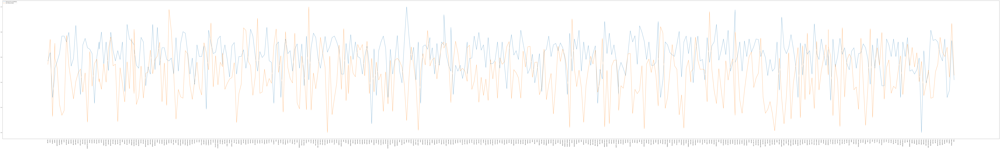

In [38]:
#high group correlation
plt.figure(figsize = (210,30))
plt.plot(high_mh_group['City_x'],  min_max_scaler.fit_transform(high_mh_group['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 9 or 10 Ratings')
plt.plot(high_mh_group['City_x'], min_max_scaler.fit_transform(high_mh_group['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

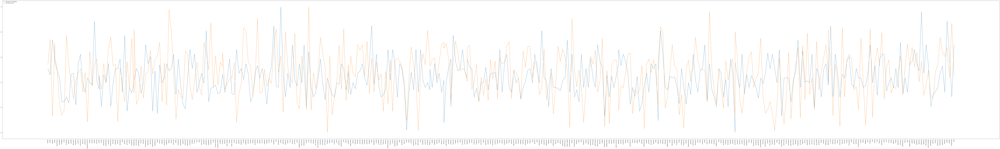

In [39]:
#medium group correlation
plt.figure(figsize = (210,30))
plt.plot(medium_mh_group['City_x'],  min_max_scaler.fit_transform(medium_mh_group['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 9 or 10 Ratings')
plt.plot(medium_mh_group['City_x'], min_max_scaler.fit_transform(medium_mh_group['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

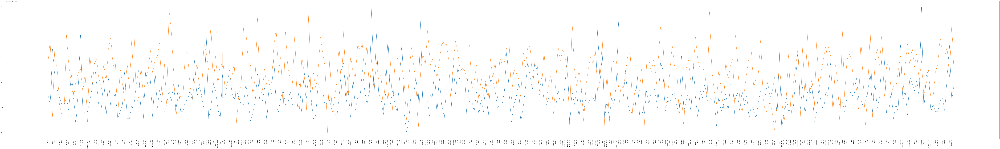

In [40]:
#low group correlation
plt.figure(figsize = (210,30))
plt.plot(low_mh_group['City_x'],  min_max_scaler.fit_transform(low_mh_group['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 9 or 10 Ratings')
plt.plot(low_mh_group['City_x'], min_max_scaler.fit_transform(low_mh_group['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         
plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

# Grouping Hospital Questions, NOT RATINGS

In [41]:
patient_survey['HCAHPS Answer Description'].unique()

array(['"Always" quiet at night',
       '"NO", patients would not recommend the hospital (they probably would not or definitely would not recommend it)',
       '"Sometimes" or "never" quiet at night',
       '"Usually" quiet at night',
       '"YES", patients would definitely recommend the hospital',
       '"YES", patients would probably recommend the hospital',
       'Doctors "always" communicated well',
       'Doctors "always" explained things so they could understand',
       'Doctors "always" listened carefully',
       'Doctors "always" treated them with courtesy and  respect',
       'Doctors "sometimes" or "never" communicated well',
       'Doctors "sometimes" or "never" explained things so they could understand',
       'Doctors "sometimes" or "never" listened carefully',
       'Doctors "sometimes" or "never" treated them with courtesy and  respect',
       'Doctors "usually"  treated them with courtesy and  respect',
       'Doctors "usually" communicated well',
       

In [42]:
#made each survey question a column 
pivot_patient = pd.pivot_table(patient_survey, values='HCAHPS Answer Percent', index=['Facility Name', 'City','State'],
                    columns=['HCAHPS Answer Description'], aggfunc=np.sum)

In [43]:
table = pivot_patient.astype(float)
table.columns

Index(['"Always" quiet at night',
       '"NO", patients would not recommend the hospital (they probably would not or definitely would not recommend it)',
       '"Sometimes" or "never" quiet at night', '"Usually" quiet at night',
       '"YES", patients would definitely recommend the hospital',
       '"YES", patients would probably recommend the hospital',
       'Doctors "always" communicated well',
       'Doctors "always" explained things so they could understand',
       'Doctors "always" listened carefully',
       'Doctors "always" treated them with courtesy and  respect',
       'Doctors "sometimes" or "never" communicated well',
       'Doctors "sometimes" or "never" explained things so they could understand',
       'Doctors "sometimes" or "never" listened carefully',
       'Doctors "sometimes" or "never" treated them with courtesy and  respect',
       'Doctors "usually"  treated them with courtesy and  respect',
       'Doctors "usually" communicated well',
       'Doctor

In [44]:
#broke down the survey questions into good and bad traits and created new columns with the average core of each trait for each facility
table['Good Noise Level'] = (table['"Always" quiet at night'] + table['"Usually" quiet at night'])

table['Good Communication'] = (((table['Doctors "always" communicated well'] + table['Doctors "always" explained things so they could understand'] + table['Doctors "always" listened carefully'] + table['Doctors "usually" communicated well'] + table['Doctors "usually" explained things so they could understand'] + table['Doctors "usually" listened carefully'])/3) +             
((table['Nurses "always" communicated well'] + table['Nurses "always" explained things so they could understand'] + table['Nurses "always" listened carefully'] + table['Nurses "usually" communicated well'] + table['Nurses "usually" explained things so they could understand'] + table['Nurses "usually" listened carefully'])/3) +            
((table['Staff "always" explained'] +table['Staff "always" explained new medications'] + table['Staff "always" explained possible side effects'] + table['Staff "usually" explained'] + table['Staff "usually" explained new medications'] + table['Staff "usually" explained possible side effects'])/3) +            
(table['Yes, staff "did" give patients information about help after discharge'] + table['Yes, staff "did" give patients information about possible symptoms'] + table['Yes, staff "did" give patients this information'])/3)/4

table['Good Respect'] = ((table['Doctors "always" treated them with courtesy and  respect'] +  table['Doctors "usually"  treated them with courtesy and  respect']) +
(table['Nurses "always" treated them with courtesy and  respect'] + table['Nurses "usually"  treated them with courtesy and  respect']) +
((table['Patients who "Agree" that staff took their preferences into account'] + table['Patients who "Agree" they understood their care when they left the hospital'] + table['Patients who "Agree" they understood their medications when they left the hospital'] + table['Patients who "Agree" they understood their responsiblities when they left the hospital'] + table['Patients who "Strongly Agree" that staff took their preferences into account'] + table['Patients who "Strongly Agree" they understood their care when they left the hospital'] + table['Patients who "Strongly Agree" they understood their medications when they left the hospital'] + table['Patients who "Strongly Agree" they understood their responsiblities when they left the hospital'])/4))/3


table['Good Response Time'] = (table['Patients "always" received bathroom help as soon as they wanted'] + table['Patients "always" received call button help as soon as they wanted'] + table['Patients "always" received help as soon as they wanted'] + table['Patients "usually" received bathroom help as soon as they wanted'] + table['Patients "usually" received call button help as soon as they wanted'] + table['Patients "usually" received help as soon as they wanted'])/3

table['Good Cleanliness'] = table['Room was "always" clean'] + table['Room was "usually" clean']


In [45]:
table['Bad Noise Level'] = table['"Sometimes" or "never" quiet at night']

table['Bad Communication'] = (((table['Doctors "sometimes" or "never" communicated well'] + table['Doctors "sometimes" or "never" explained things so they could understand'] + table['Doctors "sometimes" or "never" listened carefully'])/3) +
((table['Nurses "sometimes" or "never" communicated well'] + table['Nurses "sometimes" or "never" explained things so they could understand'] + table['Nurses "sometimes" or "never" listened carefully'])/3) +
((table['Staff "sometimes" or "never" explained'] + table['Staff "sometimes" or "never" explained new medications'] + table['Staff "sometimes" or "never" explained possible side effects'])/3) +
((table['No, staff "did not" give patients information about help after discharge'] + table['No, staff "did not" give patients information about possible symptoms'] + table['No, staff "did not" give patients this information'])/3))/4


table['Bad Respect'] = ((table['Doctors "sometimes" or "never" treated them with courtesy and  respect'])+       
(table['Nurses "sometimes" or "never" treated them with courtesy and  respect'])+    
(table['Patients who "Disagree" or "Strongly Disagree" that staff took their preferences into account'] + table['Patients who "Disagree" or "Strongly Disagree" they understood their care when they left the hospital'] + table['Patients who "Disagree" or "Strongly Disagree" they understood their medications when they left the hospital'] + table['Patients who "Disagree" or "Strongly Disagree" they understood their responsiblities when they left the hospital'])/4)/3

table['Bad Response Time'] = (table['Patients "sometimes" or "never" received bathroom help as soon as they wanted'] + table['Patients "sometimes" or "never" received call button help as soon as they wanted'] + table['Patients "sometimes" or "never" received help as soon as they wanted'])/3

table['Bad Cleanliness'] = table['Room was "sometimes" or "never" clean']

In [46]:
#ratings per facility
hospital_q = table[['Good Communication','Good Respect','Good Response Time','Good Cleanliness','Good Noise Level']].reset_index()
hospital_q

HCAHPS Answer Description,Facility Name,City,State,Good Communication,Good Respect,Good Response Time,Good Cleanliness,Good Noise Level
0,1st Medical Group (Langley AFB),Langley,VA,92.666667,96.583333,94.666667,89.0,93.0
1,60th Medical Group (Travis AFB),Fairfield,CA,92.750000,96.916667,93.000000,91.0,87.0
2,673rd Medical Group (Joint Base Elmendorf-Rich...,JBER,AK,92.916667,97.583333,93.000000,92.0,90.0
3,81st Medical Group (Keesler AFB),Biloxi,MS,95.583333,98.500000,96.000000,93.0,93.0
4,88th Medical Group (Wright-Patterson AFB),Wright-Patterson AFB,OH,94.583333,98.333333,95.333333,95.0,95.0
...,...,...,...,...,...,...,...,...
4192,YORK HOSPITAL,YORK,PA,89.666667,97.333333,94.000000,91.0,82.0
4193,YUKON KUSKOKWIM DELTA REG HOSPITAL,BETHEL,AK,90.250000,94.583333,87.333333,86.0,86.0
4194,YUMA DISTRICT HOSPITAL,YUMA,CO,NaN,NaN,NaN,92.0,96.0
4195,YUMA REGIONAL MEDICAL CENTER,YUMA,AZ,86.666667,94.333333,86.000000,91.0,87.0


In [47]:
hospital_grouped_q = hospital_q.fillna(0)
hospital_grouped_q = hospital_grouped_q.groupby(['City','State']).mean().reset_index()
hospital_grouped_q

HCAHPS Answer Description,City,State,Good Communication,Good Respect,Good Response Time,Good Cleanliness,Good Noise Level
0,ABBEVILLE,LA,90.833333,98.583333,94.666667,96.0,96.0
1,ABBEVILLE,SC,91.583333,96.750000,91.000000,92.0,99.0
2,ABERDEEN,MS,0.000000,0.000000,0.000000,92.0,87.0
3,ABERDEEN,SD,91.083333,97.458333,92.666667,94.5,94.0
4,ABERDEEN,WA,87.500000,94.833333,91.333333,92.0,79.0
...,...,...,...,...,...,...,...
3236,ZACHARY,LA,88.500000,94.666667,83.333333,92.0,89.0
3237,ZANESVILLE,OH,90.250000,95.666667,90.333333,88.0,86.0
3238,ZEELAND,MI,92.333333,98.416667,95.000000,90.0,96.0
3239,ZEPHYRHILLS,FL,90.833333,97.333333,92.333333,91.0,91.0


In [48]:
hospital_grouped_q['CityState'] = hospital_grouped_q['City'].str.lower() + ' ' + hospital_grouped_q['State']


# Mental Health vs. Hospital Grouped Qualities + Visualization

In [49]:
hospital_grouped_q_mh_df = hospital_grouped_q.merge(mh_df, how = 'left', left_on = 'CityState', right_on = 'CityState')

In [50]:
hospital_grouped_q_mh_df = hospital_grouped_q_mh_df.dropna()[['City_x','State_x','Good Communication','Good Respect','Good Response Time','Good Cleanliness','Good Noise Level','Data_Value']]

In [51]:
hospital_grouped_q_mh_df

,City_x,State_x,Good Communication,Good Respect,Good Response Time,Good Cleanliness,Good Noise Level,Data_Value
6,ABILENE,TX,88.916667,96.041667,88.500000,91.000000,93.00,14.706941
18,AKRON,OH,90.805556,97.055556,92.333333,91.333333,87.00,17.011095
20,ALAMEDA,CA,80.166667,87.500000,80.333333,86.000000,75.00,9.950210
23,ALBANY,GA,86.583333,93.833333,87.000000,86.000000,87.00,16.656936
25,ALBANY,NY,89.229167,95.979167,88.500000,90.750000,83.25,15.273985
...,...,...,...,...,...,...,...,...
3214,WYOMING,MI,91.500000,96.583333,92.333333,92.000000,90.00,15.433310
3221,YAKIMA,WA,88.000000,95.333333,89.000000,90.000000,82.00,16.277958
3225,YONKERS,NY,84.791667,91.833333,80.833333,90.000000,85.50,13.533528
3229,YOUNGSTOWN,OH,91.291667,97.125000,93.166667,90.500000,90.00,18.465598


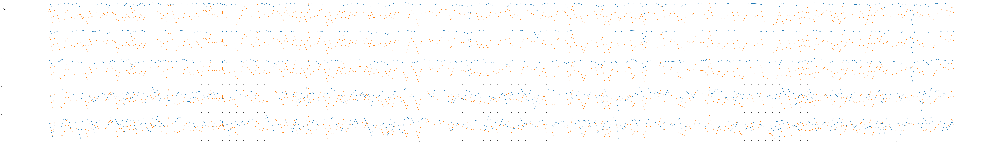

In [52]:
f, axarr = plt.subplots(5, sharex=True, figsize = (210,30))
axarr[0].plot(hospital_grouped_q_mh_df['City_x'],  min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Good Communication'].astype(float).values.reshape(-1,1)) , label = 'Communication')
axarr[0].plot(hospital_grouped_q_mh_df['City_x'], min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         

axarr[1].plot(hospital_grouped_q_mh_df['City_x'],  min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Good Respect'].astype(float).values.reshape(-1,1)) , label = 'Respect')
axarr[1].plot(hospital_grouped_q_mh_df['City_x'], min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         

axarr[2].plot(hospital_grouped_q_mh_df['City_x'],  min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Good Response Time'].astype(float).values.reshape(-1,1)) , label = 'Response Time')
axarr[2].plot(hospital_grouped_q_mh_df['City_x'], min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         

axarr[3].plot(hospital_grouped_q_mh_df['City_x'],  min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Good Cleanliness'].astype(float).values.reshape(-1,1)) , label = 'Cleanliness')
axarr[3].plot(hospital_grouped_q_mh_df['City_x'], min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         

axarr[4].plot(hospital_grouped_q_mh_df['City_x'],  min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Good Noise Level'].astype(float).values.reshape(-1,1)) , label = 'Noisiness')
axarr[4].plot(hospital_grouped_q_mh_df['City_x'], min_max_scaler.fit_transform(hospital_grouped_q_mh_df['Data_Value'].astype(float).values.reshape(-1,1)) , label = 'Poor Mental Health')         

#f.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
f.legend(loc="upper left")
f.tight_layout()

In [53]:
print(f"Communication and Mental Health Pearson Correlation: {scipy.stats.pearsonr(hospital_grouped_q_mh_df['Good Communication'], hospital_grouped_q_mh_df['Data_Value'])[0]}")
print(f"Respect and Mental Health Pearson Correlation: {scipy.stats.pearsonr(hospital_grouped_q_mh_df['Good Respect'], hospital_grouped_q_mh_df['Data_Value'])[0]}")
print(f"Response Time and Mental Health Pearson Correlation: {scipy.stats.pearsonr(hospital_grouped_q_mh_df['Good Response Time'], hospital_grouped_q_mh_df['Data_Value'])[0]}")
print(f"Cleanliness and Mental Health Pearson Correlation: {scipy.stats.pearsonr(hospital_grouped_q_mh_df['Good Cleanliness'], hospital_grouped_q_mh_df['Data_Value'])[0]}")
print(f"Noise Level and Mental Health Pearson Correlation: {scipy.stats.pearsonr(hospital_grouped_q_mh_df['Good Noise Level'], hospital_grouped_q_mh_df['Data_Value'])[0]}")

Communication and Mental Health Pearson Correlation: -0.12214152683286604
Respect and Mental Health Pearson Correlation: -0.08696905345808323
Response Time and Mental Health Pearson Correlation: -0.14275727788811798
Cleanliness and Mental Health Pearson Correlation: -0.28767521582336797
Noise Level and Mental Health Pearson Correlation: -0.07103888709604989


# Hospital Ratings vs. Drug Use by state (low, medium, high) + viz

In [54]:
patient_survey_rat['HCAHPS Answer Percent'] = patient_survey_rat['HCAHPS Answer Percent'].astype(int)
patient_rating_state = patient_survey_rat.groupby(['HCAHPS Answer Description','State']).mean().reset_index()

In [55]:
patient_rating_du = patient_rating_state.merge(drug_use, left_on = 'State', right_on = 'State')

In [56]:
patient_rating_du

,HCAHPS Answer Description,State,HCAHPS Answer Percent,12 or Older Estimate,Value,Percentage
0,"Patients who gave a rating of ""6"" or lower (low)",AK,7.500000,54000,731545,7.381637
1,"Patients who gave a rating of ""7"" or ""8"" (medium)",AK,20.642857,54000,731545,7.381637
2,"Patients who gave a rating of ""9"" or ""10"" (high)",AK,71.857143,54000,731545,7.381637
3,"Patients who gave a rating of ""6"" or lower (low)",AL,7.975904,290000,4903185,5.914523
4,"Patients who gave a rating of ""7"" or ""8"" (medium)",AL,19.253012,290000,4903185,5.914523
...,...,...,...,...,...,...
148,"Patients who gave a rating of ""7"" or ""8"" (medium)",WV,20.591837,101000,1792147,5.635698
149,"Patients who gave a rating of ""9"" or ""10"" (high)",WV,71.571429,101000,1792147,5.635698
150,"Patients who gave a rating of ""6"" or lower (low)",WY,6.880000,33000,578759,5.701855
151,"Patients who gave a rating of ""7"" or ""8"" (medium)",WY,21.080000,33000,578759,5.701855


In [57]:
patient_rating_du = patient_rating_du.groupby(['HCAHPS Answer Description','State']).mean().reset_index()

In [58]:
low_du_rat = patient_rating_du.iloc[0:51]
medium_du_rat = patient_rating_du.iloc[51:102]
high_du_rat = patient_rating_du.iloc[102:]

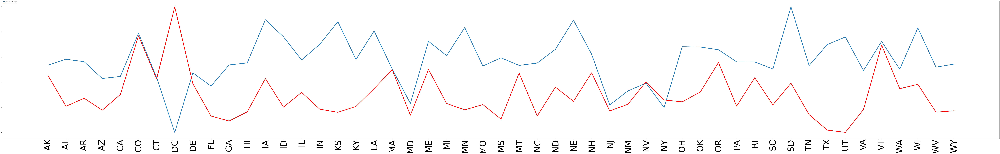

In [59]:
#high group correlation
plt.figure(figsize = (210,30))
plt.plot(high_du_rat['State'],  min_max_scaler.fit_transform(high_du_rat['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 9 or 10 Ratings', linewidth=7.0)
plt.plot(high_du_rat['State'], min_max_scaler.fit_transform(high_du_rat['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use Percent', color = 'red', linewidth=7.0)         
plt.xticks(rotation = 90, fontSize = 100) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

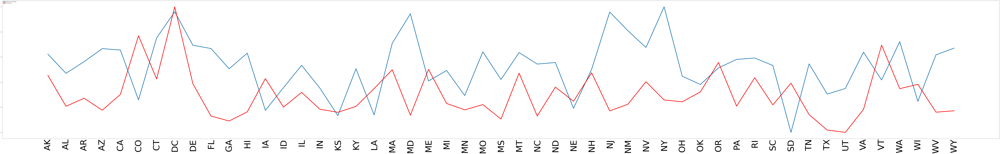

In [60]:
#medium group correlation
plt.figure(figsize = (210,30))
plt.plot(medium_du_rat['State'],  min_max_scaler.fit_transform(medium_du_rat['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 7 or 8 Ratings', linewidth=7.0)
plt.plot(medium_du_rat['State'], min_max_scaler.fit_transform(medium_du_rat['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use', color = 'red', linewidth=7.0)         
plt.xticks(rotation = 90, fontSize = 100) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

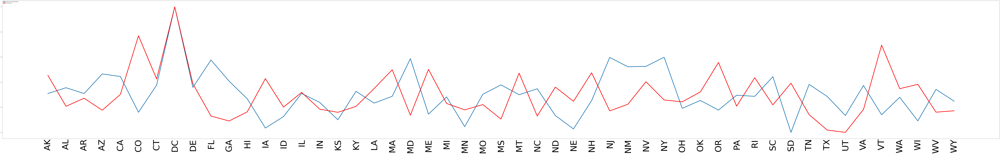

In [61]:
#low group correlation
plt.figure(figsize = (210,30))
plt.plot(low_du_rat['State'],  min_max_scaler.fit_transform(low_du_rat['HCAHPS Answer Percent'].astype(float).values.reshape(-1,1)) , label = 'Percent of 6 or Below Ratings', linewidth=7.0)
plt.plot(low_du_rat['State'], min_max_scaler.fit_transform(low_du_rat['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use', color = 'red', linewidth=7.0)         
plt.xticks(rotation = 90, fontSize = 100) # Rotates X-Axis Ticks by 90-degrees
plt.legend(loc="upper left")
plt.show()

In [62]:
print(f"High Rating (9-10) Pearson Correlation: {scipy.stats.pearsonr(high_du_rat['HCAHPS Answer Percent'], high_du_rat['12 or Older Estimate'])[0]}")
print(f"Medium Rating (7-8) Pearson Correlation: {scipy.stats.pearsonr(medium_du_rat['HCAHPS Answer Percent'], medium_du_rat['12 or Older Estimate'])[0]}")
print(f"Low Rating (0-6) Pearson Correlation: {scipy.stats.pearsonr(low_du_rat['HCAHPS Answer Percent'], low_du_rat['12 or Older Estimate'])[0]}")

High Rating (9-10) Pearson Correlation: -0.20338459473988627
Medium Rating (7-8) Pearson Correlation: 0.15282296004322882
Low Rating (0-6) Pearson Correlation: 0.23777773445075956


In [63]:
patient_grouped_du = hospital_grouped_q.groupby('State').mean().merge(drug_use, left_on = 'State', right_on = 'State')

In [64]:
patient_grouped_du.head()

,State,Good Communication,Good Respect,Good Response Time,Good Cleanliness,Good Noise Level,12 or Older Estimate,Value,Percentage
0,AK,83.685185,88.759259,84.861111,92.111111,91.861111,54000,731545,7.381637
1,AL,81.621212,86.988794,81.694444,91.407197,92.831439,290000,4903185,5.914523
2,AR,74.901574,80.517407,76.564630,93.006111,93.023889,190000,3017804,6.295969
3,AZ,82.560337,88.449864,84.282501,91.507666,87.955517,417000,7278717,5.729032
4,CA,85.513117,91.862090,86.146707,91.620683,84.326339,2559000,39512223,6.476477


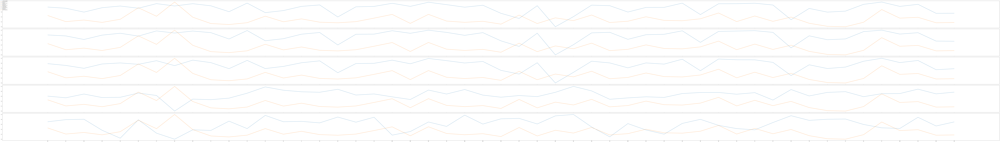

In [65]:
f1, axdu = plt.subplots(5, sharex=True, figsize = (210,30))
axdu[0].plot(patient_grouped_du['State'],  min_max_scaler.fit_transform(patient_grouped_du['Good Communication'].astype(float).values.reshape(-1,1)) , label = 'Communication')
axdu[0].plot(patient_grouped_du['State'], min_max_scaler.fit_transform(patient_grouped_du['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use')         

axdu[1].plot(patient_grouped_du['State'],  min_max_scaler.fit_transform(patient_grouped_du['Good Respect'].astype(float).values.reshape(-1,1)) , label = 'Respect')
axdu[1].plot(patient_grouped_du['State'], min_max_scaler.fit_transform(patient_grouped_du['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use')  

axdu[2].plot(patient_grouped_du['State'],  min_max_scaler.fit_transform(patient_grouped_du['Good Response Time'].astype(float).values.reshape(-1,1)) , label = 'Response')
axdu[2].plot(patient_grouped_du['State'], min_max_scaler.fit_transform(patient_grouped_du['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use')  

axdu[3].plot(patient_grouped_du['State'],  min_max_scaler.fit_transform(patient_grouped_du['Good Cleanliness'].astype(float).values.reshape(-1,1)) , label = 'Cleanliness')
axdu[3].plot(patient_grouped_du['State'], min_max_scaler.fit_transform(patient_grouped_du['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use')  

axdu[4].plot(patient_grouped_du['State'],  min_max_scaler.fit_transform(patient_grouped_du['Good Noise Level'].astype(float).values.reshape(-1,1)) , label = 'Noisiness')
axdu[4].plot(patient_grouped_du['State'], min_max_scaler.fit_transform(patient_grouped_du['Percentage'].astype(float).values.reshape(-1,1)) , label = 'Illicit Drug Use')  

#f.xticks(rotation = 90) # Rotates X-Axis Ticks by 90-degrees
f1.legend(loc="upper left")
f1.tight_layout()

In [66]:
print(f"Communication and Drug Use Pearson Correlation: {scipy.stats.pearsonr(patient_grouped_du['Good Communication'], patient_grouped_du['Percentage'])[0]}")
print(f"Respect and Drug Use Distance Pearson: {scipy.stats.pearsonr(patient_grouped_du['Good Respect'], patient_grouped_du['Percentage'])[0]}")
print(f"Response Time and Drug Use Pearson Correlation: {scipy.stats.pearsonr(patient_grouped_du['Good Response Time'], patient_grouped_du['Percentage'])[0]}")
print(f"Cleanliness and Drug Use Pearson Correlation: {scipy.stats.pearsonr(patient_grouped_du['Good Cleanliness'], patient_grouped_du['Percentage'])[0]}")
print(f"Noise Level and Drug Use Pearson Correlation: {scipy.stats.pearsonr(patient_grouped_du['Good Noise Level'], patient_grouped_du['Percentage'])[0]}")

Communication and Drug Use Pearson Correlation: 0.1713593383988013
Respect and Drug Use Distance Pearson: 0.1537002498651216
Response Time and Drug Use Pearson Correlation: 0.15092649512949874
Cleanliness and Drug Use Pearson Correlation: -0.16516673842270796
Noise Level and Drug Use Pearson Correlation: -0.23192597369220405


# Star Plot

In [67]:
hospital_q['Average Score'] = (hospital_q['Good Communication'] + hospital_q['Good Respect']
+ hospital_q['Good Response Time'] + hospital_q['Good Cleanliness'] + hospital_q['Good Noise Level'])/5
best_to_worst_facilities = hospital_q.sort_values('Average Score', ascending = False).dropna().reset_index(drop = True)
best_to_worst_facilities = best_to_worst_facilities.merge(drug_use, how = 'left', left_on = 'State', right_on = 'State')
best_to_worst_facilities['CityState'] = best_to_worst_facilities['City'].str.lower() + " " + best_to_worst_facilities['State']
best_to_worst_facilities = best_to_worst_facilities.merge(mh_df, how = 'left', left_on = 'CityState', right_on = 'CityState')
best_to_worst_facilities = best_to_worst_facilities[['Facility Name','City_x','State_x','Good Communication','Good Respect','Good Response Time','Good Cleanliness','Good Noise Level','Average Score','Percentage','Data_Value']]
best_to_worst_facilities = best_to_worst_facilities.rename({'Average Score': 'average rating','Percentage': 'substance abuse percentage','Data_Value':'poor mental health percentage'}, axis = 1)
best_to_worst_facilities.sort_values(['substance abuse percentage', 'average rating'], ascending = [False, False])

,Facility Name,City_x,State_x,Good Communication,Good Respect,Good Response Time,Good Cleanliness,Good Noise Level,average rating,substance abuse percentage,poor mental health percentage
1762,SIBLEY MEMORIAL HOSPITAL,WASHINGTON,DC,89.583333,96.916667,88.333333,94.0,94.0,92.566667,10.627008,NaN
2819,MEDSTAR GEORGETOWN UNIVERSITY HOSPITAL,WASHINGTON,DC,90.583333,95.916667,87.666667,92.0,86.0,90.433333,10.627008,NaN
3644,GEORGE WASHINGTON UNIV HOSPITAL,WASHINGTON,DC,87.500000,94.750000,84.000000,87.0,81.0,86.850000,10.627008,NaN
3671,MEDSTAR WASHINGTON HOSPITAL CENTER,WASHINGTON,DC,87.833333,94.083333,81.333333,88.0,82.0,86.650000,10.627008,NaN
3696,WASHINGTON DC VA MEDICAL CENTER,WASHINGTON,DC,86.583333,92.750000,85.000000,84.0,84.0,86.466667,10.627008,NaN
...,...,...,...,...,...,...,...,...,...,...,...
3602,"DOCTORS' CENTER HOSPITAL, INC",MANATI,PR,80.416667,93.333333,80.333333,94.0,88.0,87.216667,NaN,NaN
3722,DOCTOR'S CENTER DE SAN JUAN,FERNANDEZ JUNCOS,PR,79.666667,92.500000,78.000000,92.0,88.0,86.033333,NaN,NaN
3772,"ROY LESTER SCHNEIDER HOSPITAL,THE",ST THOMAS,VI,81.916667,93.166667,82.000000,87.0,81.0,85.016667,NaN,NaN
3828,GOV JUAN F LUIS HOSPITAL & MEDICAL CTR,ST CROIX,VI,82.416667,93.000000,83.000000,87.0,72.0,83.483333,NaN,NaN


In [68]:
labels = ["Good Communication", "Respectful", "Quick Response Time", "Clean",'Quiet']
points = len(labels)
angles = np.linspace(0, 2 * np.pi, points, endpoint=False).tolist()
angles += angles[:1]

In [69]:
def add_to_star(hospital, color, category =None, label=None):
    if category != None:
        category = str(category).lower()
        btw = best_to_worst_facilities.sort_values([category, 'average rating'], ascending = [False, False]).reset_index(drop = True)
        values = btw[btw[category].notnull()].iloc[hospital,3:8].tolist()
        values += values[:1]
    else:
        btw = best_to_worst_facilities.sort_values('average rating', ascending = False).reset_index(drop = True)
        values = btw[btw['average rating'].notnull()].iloc[hospital,3:8].tolist()
        values += values[:1]
    if label != None:
        ax.plot(angles, values, color=color, linewidth=1, label=label)
    else:
        if category != None:
            category = str(category).lower()
            btw = best_to_worst_facilities.sort_values([category, 'average rating'], ascending = [False, False]).reset_index(drop = True)
            ax.plot(angles, values, color=color, linewidth=1, label=btw[btw[category].notnull()].iloc[hospital,0:3].values)
        else:
            btw = best_to_worst_facilities.sort_values('average rating', ascending = False).reset_index(drop = True)
            ax.plot(angles, values, color=color, linewidth=1, label=btw[btw['average rating'].notnull()].iloc[hospital,0:3].values)
    ax.fill(angles, values, color=color, alpha=.1)

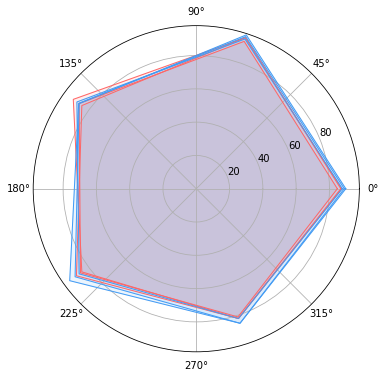

In [70]:
## Create plot object   
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
## Plot a new hospital with the add_to_star function

#worst three
add_to_star(0, '#FF6666', 'poor mental health percentage')
add_to_star(1, '#FF6666', 'poor mental health percentage')
add_to_star(2, '#FF6666', 'poor mental health percentage')

#best three(lowest poor mental health)
add_to_star(-1, '#429bf4', 'poor mental health percentage')
add_to_star(-2, '#429bf4', 'poor mental health percentage')
add_to_star(-3, '#429bf4', 'poor mental health percentage')


In [71]:

## Fix axis to star from top
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
## Edit x axis labels
for label, angle in zip(ax.get_xticklabels(), angles):
    if angle in (0, np.pi):
        label.set_horizontalalignment('center')
    elif 0 < angle < np.pi:
        label.set_horizontalalignment('left')
    else:
        label.set_horizontalalignment('right')
## Customize your graphic
# Change the location of the gridlines or remove them
ax.set_rgrids([20, 40, 60 ,80])
#ax.set_rgrids([]) # This removes grid lines
# Change the color of the ticks
ax.tick_params(colors='#222222')
# Make the y-axis labels larger, smaller, or remove by setting fontsize
ax.tick_params(axis='y', labelsize=0)
# Make the x-axis labels larger or smaller.
ax.tick_params(axis='x', labelsize=13)
# Change the color of the circular gridlines.
ax.grid(color='#AAAAAA')
# Change the color of the outer circle
ax.spines['polar'].set_color('#222222')
# Change the circle background color
ax.set_facecolor('#FAFAFA')
# Add title and legend
ax.set_title('Comparing Hospitals Across Categories', y=1.08)
ax.legend(loc='upper right', bbox_to_anchor=(2.1, 1.1))
# Draw axis lines for each angle and label.
ax.set_thetagrids(np.degrees(angles), labels)

ValueError: The number of FixedLocator locations (6), usually from a call to set_ticks, does not match the number of ticklabels (5).

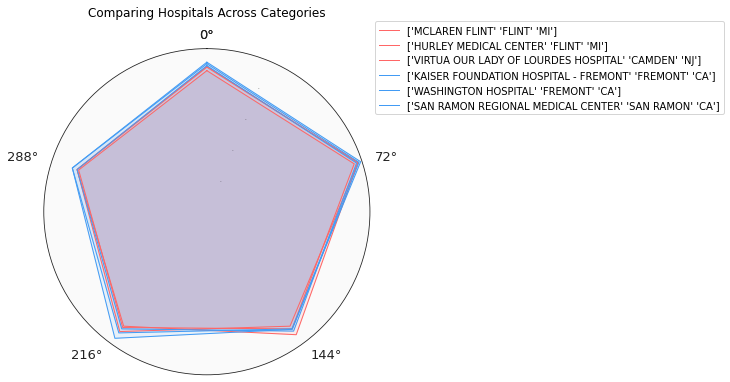

In [72]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

fig.savefig("star_plot.jpeg", dpi=300, bbox_inches = 'tight')

fig

# Additional Visualizations

In [73]:
import plotly.express as px

In [78]:
from sklearn.preprocessing import MinMaxScaler
from plotly.subplots import make_subplots
import plotly.io

cols_to_norm = ['HCAHPS Answer Percent','Percentage']
min_max_scaler = MinMaxScaler()
#patient_rating_du[cols_to_norm] = min_max_scaler.fit_transform(patient_rating_du[cols_to_norm].astype(float))
low_du_rat['HCAHPS Answer Percent'] = min_max_scaler.fit_transform(np.array(low_du_rat['HCAHPS Answer Percent'].astype(float)).reshape(-1,1))
low_du_rat['Percentage'] = min_max_scaler.fit_transform(np.array(low_du_rat['Percentage'].astype(float)).reshape(-1,1))

medium_du_rat['HCAHPS Answer Percent'] = min_max_scaler.fit_transform(np.array(medium_du_rat['HCAHPS Answer Percent'].astype(float)).reshape(-1,1))
medium_du_rat['Percentage'] = min_max_scaler.fit_transform(np.array(medium_du_rat['Percentage'].astype(float)).reshape(-1,1))

high_du_rat['HCAHPS Answer Percent'] = min_max_scaler.fit_transform(np.array(high_du_rat['HCAHPS Answer Percent'].astype(float)).reshape(-1,1))
high_du_rat['Percentage'] = min_max_scaler.fit_transform(np.array(high_du_rat['Percentage'].astype(float)).reshape(-1,1))

#px.scatter(low_mh_group, y = 'HCAHPS Answer Percent',x = 'Data_Value',hover_name = 'City_x', facet_col = 'HCAHPS Answer Description', facet_col_wrap = 1, trendline = 'ols', width = 1000, height = 400, trendline_color_override = '#FF6666', labels ={'Percentage':'Illicit Drug Use Percentage'})
#px.scatter(medium_mh_group, y = 'HCAHPS Answer Percent',x = 'Data_Value',hover_name = 'City_x', facet_col = 'HCAHPS Answer Description', facet_col_wrap = 1, trendline = 'ols', width = 1000, height = 400, trendline_color_override = '#FF6666', labels ={'Percentage':'Illicit Drug Use Percentage'})
fig1 = px.scatter(high_du_rat, y = 'HCAHPS Answer Percent',x = 'Percentage',hover_name = 'State', facet_col = 'HCAHPS Answer Description', facet_col_wrap = 1, trendline = 'ols', width = 1000, height = 400, trendline_color_override = '#FF6666', labels ={'Percentage':'Illicit Drug Use Percentage'})

fig1

ModuleNotFoundError: No module named 'statsmodels'

In [79]:
import altair as alt
cols_to_norm = ['Good Communication','Good Respect','Good Response Time','Good Cleanliness','Good Noise Level','Data_Value']
min_max_scaler = MinMaxScaler()
hospital_grouped_q_mh_df[cols_to_norm] = min_max_scaler.fit_transform(hospital_grouped_q_mh_df[cols_to_norm].astype(float))

hospital_grouped_q_mh_df['Good Communication'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Good Communication'].astype(float)).reshape(-1,1))
hospital_grouped_q_mh_df['Good Respect'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Good Respect'].astype(float)).reshape(-1,1))
hospital_grouped_q_mh_df['Good Response Time'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Good Response Time'].astype(float)).reshape(-1,1))
hospital_grouped_q_mh_df['Good Cleanliness'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Good Cleanliness'].astype(float)).reshape(-1,1))
hospital_grouped_q_mh_df['Good Noise Level'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Good Noise Level'].astype(float)).reshape(-1,1))
hospital_grouped_q_mh_df['Data_Value'] = min_max_scaler.fit_transform(np.array(hospital_grouped_q_mh_df['Data_Value'].astype(float)).reshape(-1,1))




base = alt.Chart(hospital_grouped_q_mh_df).encode(x='Data_Value')

alt.hconcat(
    base.mark_line(color= '#66c2a5').encode(y='Good Communication'),
    base.mark_line(color= '#fc8d62').encode(y='Good Respect'),
    base.mark_line(color= '#8da0cb').encode(y='Good Response Time'),
    base.mark_line(color= '#e78ac3').encode(y='Good Cleanliness'),
    base.mark_line(color= '#a6d854').encode(y='Good Noise Level'),
    #base.mark_line(color= '#ffd92f').encode(y='Data_Value')
)


ModuleNotFoundError: No module named 'altair'

In [80]:
import altair as alt
cols_to_norm = ['Good Communication','Good Respect','Good Response Time','Good Cleanliness','Good Noise Level','Percentage']
min_max_scaler = MinMaxScaler()

patient_grouped_du['Good Communication'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Good Communication'].astype(float)).reshape(-1,1))
patient_grouped_du['Good Respect'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Good Respect'].astype(float)).reshape(-1,1))
patient_grouped_du['Good Response Time'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Good Response Time'].astype(float)).reshape(-1,1))
patient_grouped_du['Good Cleanliness'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Good Cleanliness'].astype(float)).reshape(-1,1))
patient_grouped_du['Good Noise Level'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Good Noise Level'].astype(float)).reshape(-1,1))
patient_grouped_du['Percentage'] = min_max_scaler.fit_transform(np.array(patient_grouped_du['Percentage'].astype(float)).reshape(-1,1))






base = alt.Chart(patient_grouped_du).encode(x='Percentage')

linegraph_fig = alt.hconcat(
    base.mark_line(color= '#66c2a5').encode(y='Good Communication').properties(
    height=300,
    width=300),
    base.mark_line(color= '#fc8d62').encode(y='Good Respect').properties(
    height=300,
    width=300),
    base.mark_line(color= '#8da0cb').encode(y='Good Response Time').properties(
    height=300,
    width=300),
    base.mark_line(color= '#e78ac3').encode(y='Good Cleanliness').properties(
    height=300,
    width=300),
    base.mark_line(color= '#a6d854').encode(y='Good Noise Level').properties(
    height =300,
    width=300),
    #base.mark_line(color= '#ffd92f').encode(y='Data_Value')
)

linegraph_fig
#linegraph_fig.save('line_graph.png')

ModuleNotFoundError: No module named 'altair'